In [1]:
import os
import pandas as pd   # importing and manipulating data
import numpy as np    # for performing linear algebric functions
import matplotlib.pyplot as plt    #visualization of data
plt.style.use('ggplot')
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import re
from nltk.tokenize import WordPunctTokenizer
tok = WordPunctTokenizer()

In [2]:
third_wave_df = pd.read_csv('E:/Project 5 credits/Final Project/thirdwave.csv',  sep='\t')
third_wave_df.head()

,id,conversation_id,created_at,date,time,timezone,user_id,username,name,place,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,1395219809416093702,1395219809416093702,2021-05-20 08:58:19 Sri Lanka Standard Time,2021-05-20,08:58:19,530,1357525011381297152,imtanishks,Tanishk Sharma 🇮🇳,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
1,1395219809143443462,1394982027171147776,2021-05-20 08:58:19 Sri Lanka Standard Time,2021-05-20,08:58:19,530,2781482935,ambuj19nov,Ambuj singh,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'in_positivity', 'name': 'Sal...",NaN,NaN,NaN,NaN
2,1395219803330146305,1392268828654981122,2021-05-20 08:58:17 Sri Lanka Standard Time,2021-05-20,08:58:17,530,152459424,nhk_varma,nhkv,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'Dharma2X', 'name': 'Dharma',...",NaN,NaN,NaN,NaN
3,1395219786351603715,1395219786351603715,2021-05-20 08:58:13 Sri Lanka Standard Time,2021-05-20,08:58:13,530,111258784,amit_joshi07,Amit Joshi,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
4,1395219769716920323,1394929876646301699,2021-05-20 08:58:09 Sri Lanka Standard Time,2021-05-20,08:58:09,530,1035064947808514048,abhirajuneja,Abhira juneja,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'NirbhayShahaba1', 'name': 'N...",NaN,NaN,NaN,NaN


In [3]:
third_wave_df.info(null_counts=True)

c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  """Entry point for launching an IPython kernel.


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100786 entries, 0 to 100785
Data columns (total 36 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               100786 non-null  int64  
 1   conversation_id  100786 non-null  int64  
 2   created_at       100786 non-null  object 
 3   date             100786 non-null  object 
 4   time             100786 non-null  object 
 5   timezone         100786 non-null  int64  
 6   user_id          100786 non-null  int64  
 7   username         100786 non-null  object 
 8   name             100786 non-null  object 
 9   place            521 non-null     object 
 10  tweet            100786 non-null  object 
 11  language         100786 non-null  object 
 12  mentions         100786 non-null  object 
 13  urls             100786 non-null  object 
 14  photos           100786 non-null  object 
 15  replies_count    100786 non-null  int64  
 16  retweets_count   100786 non-null  int6

In [4]:
third_wave_df.dtypes

id                   int64
conversation_id      int64
created_at          object
date                object
time                object
timezone             int64
user_id              int64
username            object
name                object
place               object
tweet               object
language            object
mentions            object
urls                object
photos              object
replies_count        int64
retweets_count       int64
likes_count          int64
hashtags            object
cashtags            object
link                object
retweet               bool
quote_url           object
video                int64
thumbnail           object
near                object
geo                float64
source             float64
user_rt_id         float64
user_rt            float64
retweet_id         float64
reply_to            object
retweet_date       float64
translate          float64
trans_src          float64
trans_dest         float64
dtype: object

<AxesSubplot:>

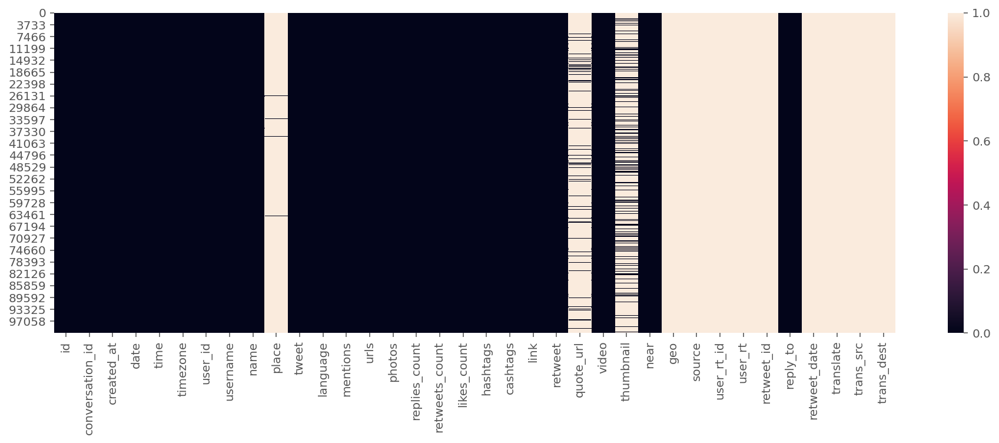

In [5]:
# check for null value in data
plt.figure(figsize = (16,5))
sns.heatmap(third_wave_df.isnull())

In [6]:
import plotly.express as px

missed = pd.DataFrame()
missed['column'] = third_wave_df.columns

missed['percent'] = [round(100* third_wave_df[col].isnull().sum() / len(third_wave_df), 2) for col in third_wave_df.columns]
missed = missed.sort_values('percent')
missed = missed[missed['percent']>0]

fig = px.bar(
    missed, 
    x='percent', 
    y="column", 
    orientation='h', 
    title='Missed values percent for every column (percent > 0)', 
    height=400, 
    width=600
)

fig.show()

In [7]:
third_wave_df.corr()

,id,conversation_id,timezone,user_id,replies_count,retweets_count,likes_count,retweet,video,geo,source,user_rt_id,user_rt,retweet_id,retweet_date,translate,trans_src,trans_dest
id,1.000000,0.287866,NaN,-0.008478,0.001118,0.005309,0.006084,NaN,-0.062430,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
conversation_id,0.287866,1.000000,NaN,0.007410,0.001341,0.003417,0.003309,NaN,-0.008317,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
timezone,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
user_id,-0.008478,0.007410,NaN,1.000000,-0.026347,-0.029991,-0.026562,NaN,0.069156,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
replies_count,0.001118,0.001341,NaN,-0.026347,1.000000,0.635556,0.711296,NaN,0.024834,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
retweets_count,0.005309,0.003417,NaN,-0.029991,0.635556,1.000000,0.834284,NaN,0.040114,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
likes_count,0.006084,0.003309,NaN,-0.026562,0.711296,0.834284,1.000000,NaN,0.030313,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
retweet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
video,-0.062430,-0.008317,NaN,0.069156,0.024834,0.040114,0.030313,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
geo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Text(0.5, 1.0, 'Correlation Heatmap')

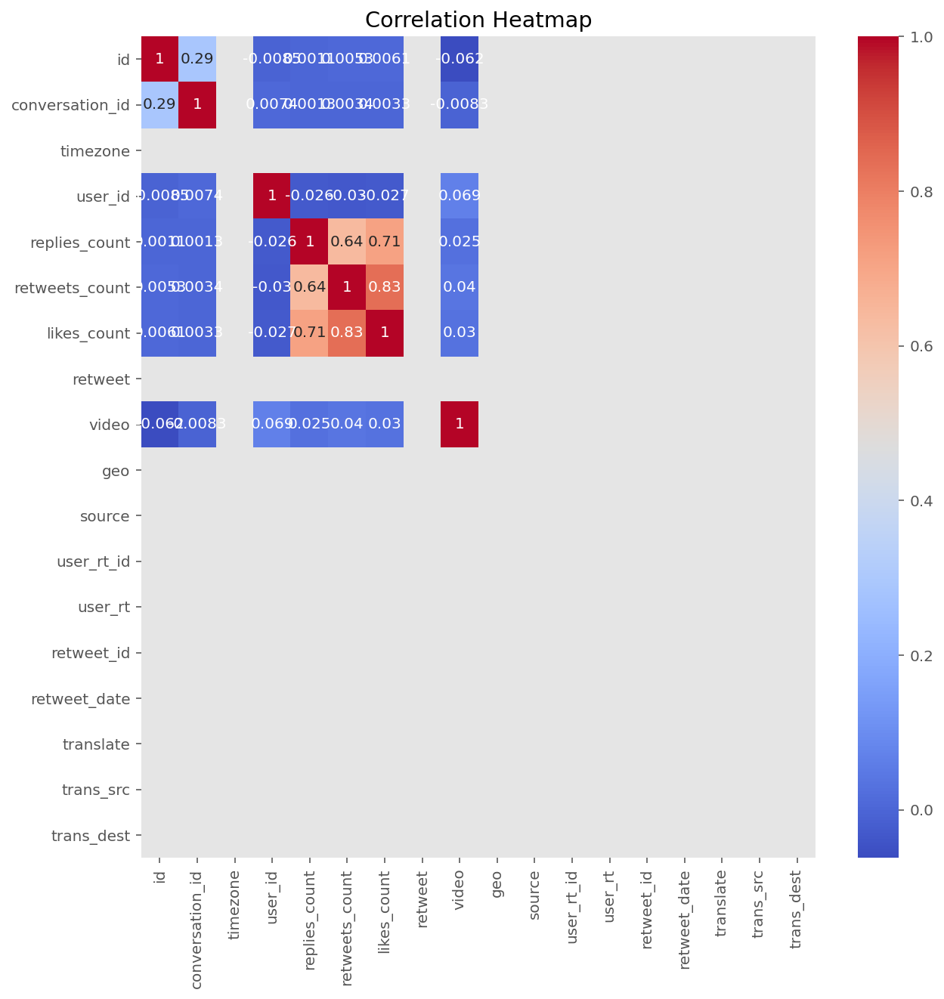

In [8]:
plt.figure(figsize=(10,10))
sns.heatmap(third_wave_df.corr(), annot=True, cmap="coolwarm").set_title('Correlation Heatmap')

In [9]:
df_new = third_wave_df['username'].value_counts().reset_index()
df_new.columns = ['username', 'tweets_count']
df_new = df_new.sort_values(['tweets_count'])

fig = px.bar(
    df_new.tail(20), 
    x="tweets_count", 
    y="username", 
    orientation='h', 
    title='Top 20 users by number of tweets', 
    width=800, 
    height=800
)

fig.show()

In [10]:
df_new.tail(10)

,username,tweets_count
9,republic,157
8,hiremaidea,184
7,nandkis09458351,188
6,tpm_news,199
5,mirza6660,203
4,paharibazar,210
3,covidplasmain,223
2,sirajnoorani,239
1,timesnow,266
0,hindustantimes,278


In [11]:
third_wave_df= pd.merge(third_wave_df, df_new, on='username')

In [12]:
third_wave_df.drop(['hashtags','cashtags','thumbnail','source','user_rt','retweet_id','reply_to','retweet_date','translate','trans_src','trans_dest', 'timezone', 'name', 'created_at', 'user_id', 'place', 'likes_count', 'link', 'retweet', 'quote_url', 'video', 'user_rt_id', 'near', 'geo', 'mentions', 'urls', 'photos', 'replies_count', 'retweets_count','conversation_id'], axis = 1, inplace = True)
third_wave_df.drop_duplicates()
third_wave_df.head()

,id,date,time,username,tweet,language,tweets_count
0,1395219809416093702,2021-05-20,08:58:19,imtanishks,@suryapsingh_IAS @DevprakasMeena @NayakRagini ...,en,1
1,1395219809143443462,2021-05-20,08:58:19,ambuj19nov,@in_positivity @BeingSalmanKhan @BabaSiddique ...,en,1
2,1395219803330146305,2021-05-20,08:58:17,nhk_varma,@Dharma2X @Swamy39 @RamyaBhat26 @nviswam @rang...,en,2
3,1393061403561533440,2021-05-14,10:01:35,nhk_varma,"@rashtrapatibhvn Sir, what makes you refrain f...",en,2
4,1395219786351603715,2021-05-20,08:58:13,amit_joshi07,"Madam FM is truly ruthless, in these panadamic...",en,2


In [13]:
third_wave_df.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100786 entries, 0 to 100785
Data columns (total 7 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            100786 non-null  int64 
 1   date          100786 non-null  object
 2   time          100786 non-null  object
 3   username      100786 non-null  object
 4   tweet         100786 non-null  object
 5   language      100786 non-null  object
 6   tweets_count  100786 non-null  int64 
dtypes: int64(2), object(5)
memory usage: 6.2+ MB


c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

null_counts is deprecated. Use show_counts instead



<AxesSubplot:>

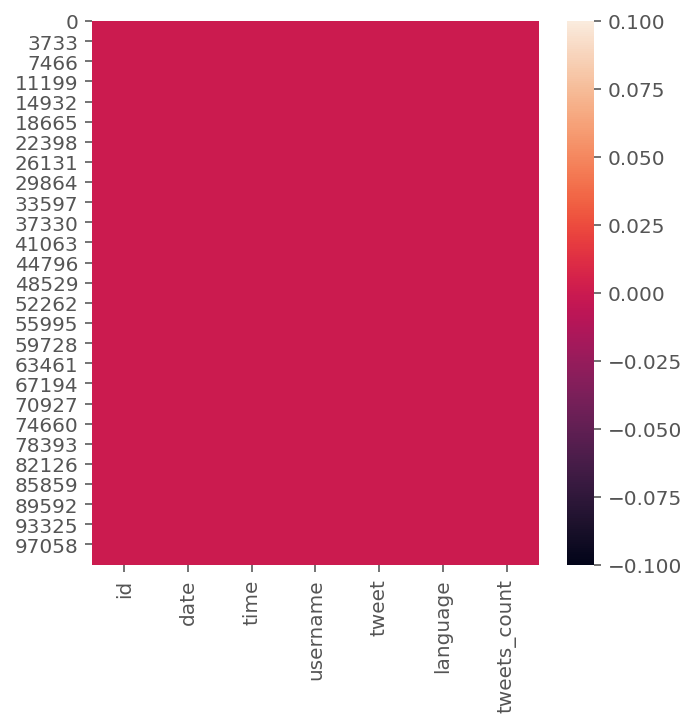

In [14]:
# check for null value in data
plt.figure(figsize = (5,5))
sns.heatmap(third_wave_df.isnull())

Text(0.5, 1.0, 'Correlation Heatmap After Dropping Null Val')

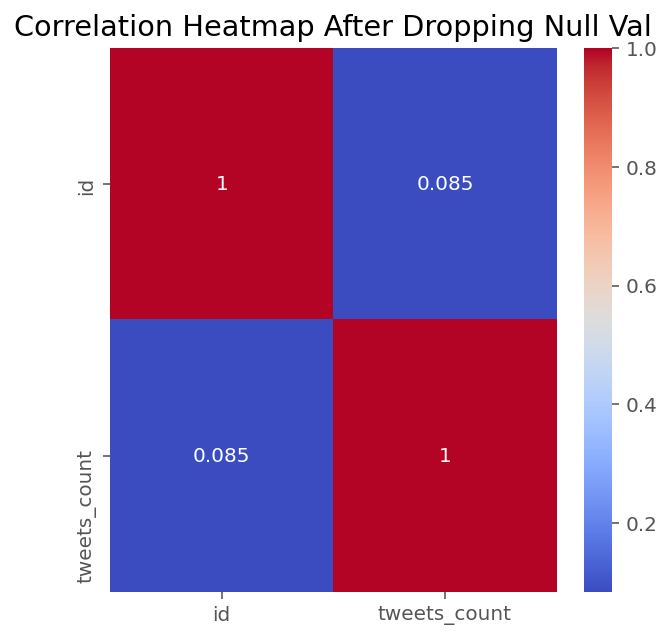

In [15]:
plt.figure(figsize=(5,5))
sns.heatmap(third_wave_df.corr(), annot=True, cmap="coolwarm").set_title('Correlation Heatmap After Dropping Null Val')

In [16]:
df_english_only = third_wave_df[third_wave_df['language'] == 'en']
df_english_only.head()

,id,date,time,username,tweet,language,tweets_count
0,1395219809416093702,2021-05-20,08:58:19,imtanishks,@suryapsingh_IAS @DevprakasMeena @NayakRagini ...,en,1
1,1395219809143443462,2021-05-20,08:58:19,ambuj19nov,@in_positivity @BeingSalmanKhan @BabaSiddique ...,en,1
2,1395219803330146305,2021-05-20,08:58:17,nhk_varma,@Dharma2X @Swamy39 @RamyaBhat26 @nviswam @rang...,en,2
3,1393061403561533440,2021-05-14,10:01:35,nhk_varma,"@rashtrapatibhvn Sir, what makes you refrain f...",en,2
4,1395219786351603715,2021-05-20,08:58:13,amit_joshi07,"Madam FM is truly ruthless, in these panadamic...",en,2


In [17]:
third_wave_df_reindex = pd.concat([df_english_only], ignore_index=True)

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import collections
import re
import networkx as nx

import nltk
from nltk.corpus import stopwords
stopwords=set(stopwords.words('english'))
from nltk.util import ngrams
from nltk import bigrams
nltk.download('stopwords')

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
%config InlineBackend.figure_format = 'retina'

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\nimes\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [19]:
df_new = third_wave_df_reindex[third_wave_df_reindex['tweet'].notnull()]
df_new['text'] = df_new['tweet'].apply(lambda x: ' '.join([item for item in x.split() if item not in stopwords]))
print(df_new)

                        id        date      time         username  \
0      1395219809416093702  2021-05-20  08:58:19       imtanishks   
1      1395219809143443462  2021-05-20  08:58:19       ambuj19nov   
2      1395219803330146305  2021-05-20  08:58:17        nhk_varma   
3      1393061403561533440  2021-05-14  10:01:35        nhk_varma   
4      1395219786351603715  2021-05-20  08:58:13     amit_joshi07   
...                    ...         ...       ...              ...   
81555  1392810946972766220  2021-05-13  17:26:21    govindaksingh   
81556  1392810944372215808  2021-05-13  17:26:20     naveenalluru   
81557  1392810931810226177  2021-05-13  17:26:17  sriniva88708783   
81558  1392810913883844610  2021-05-13  17:26:13    srini_phd_iim   
81559  1392810868014870531  2021-05-13  17:26:02        sidiitkgp   

                                                   tweet language  \
0      @suryapsingh_IAS @DevprakasMeena @NayakRagini ...       en   
1      @in_positivity @BeingSalma

In [20]:
#Remove Urls and HTML links
def remove_urls(text):
    url_remove = re.compile(r'https?://\S+|www\.\S+')
    return url_remove.sub(r'', text)
df_new['text']=df_new['text'].apply(lambda x:remove_urls(x))

def remove_html(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)
df_new['text']=df_new['text'].apply(lambda x:remove_html(x))

# Lower casing
def lower(text):
    low_text= text.lower()
    return low_text
df_new['text']=df_new['text'].apply(lambda x:lower(x))

# Number removal
def remove_num(text):
    remove= re.sub(r'\d+', '', text)
    return remove
df_new['text']=df_new['text'].apply(lambda x:remove_num(x))

def punct_remove(text):
    punct = re.sub(r"[^\w\s\d]","", text)
    return punct
df_new['text']=df_new['text'].apply(lambda x:punct_remove(x))

def remove_mention(x):
    text=re.sub(r'@\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_mention(x))

def remove_hash(x):
    text=re.sub(r'#\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_hash(x))


#Remove extra white space left while removing stuff
def remove_space(text):
    space_remove = re.sub(r"\s+"," ",text).strip()
    return space_remove
df_new['text']=df_new['text'].apply(lambda x:remove_space(x))

###########################################################################################################

'''
def clean(text):
    text = re.sub('https?://\S+|www\.\S+', '', text)  
    text = re.sub(r'\s+', ' ', text, flags=re.I)
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub(r'@\w+','',text)
    text = re.sub(r'#\w+','',text)
    return text   
df_new['text'] = df_new['text'].apply(lambda x:clean(x))
'''

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()
scores=[]
for i in range(len(df_new['text'])):
    
    score = analyser.polarity_scores(df_new['text'][i])
    score=score['compound']
    scores.append(score)
sentiment=[]
for i in scores:
    if i>=0.05:
        sentiment.append('Positive')
    elif i<=(-0.05):
        sentiment.append('Negative')
    else:
        sentiment.append('Neutral')
df_new['sentiment']=pd.Series(np.array(sentiment))

In [21]:
df_new.head()

,id,date,time,username,tweet,language,tweets_count,text,sentiment
0,1395219809416093702,2021-05-20,08:58:19,imtanishks,@suryapsingh_IAS @DevprakasMeena @NayakRagini ...,en,1,suryapsingh_ias devprakasmeena nayakragini abh...,Positive
1,1395219809143443462,2021-05-20,08:58:19,ambuj19nov,@in_positivity @BeingSalmanKhan @BabaSiddique ...,en,1,in_positivity beingsalmankhan babasiddique pls...,Positive
2,1395219803330146305,2021-05-20,08:58:17,nhk_varma,@Dharma2X @Swamy39 @RamyaBhat26 @nviswam @rang...,en,2,dharmax swamy ramyabhat nviswam ranganaathan c...,Positive
3,1393061403561533440,2021-05-14,10:01:35,nhk_varma,"@rashtrapatibhvn Sir, what makes you refrain f...",en,2,rashtrapatibhvn sir makes refrain expressing c...,Negative
4,1395219786351603715,2021-05-20,08:58:13,amit_joshi07,"Madam FM is truly ruthless, in these panadamic...",en,2,madam fm truly ruthless panadamic times people...,Positive


(-0.5, 399.5, 199.5, -0.5)

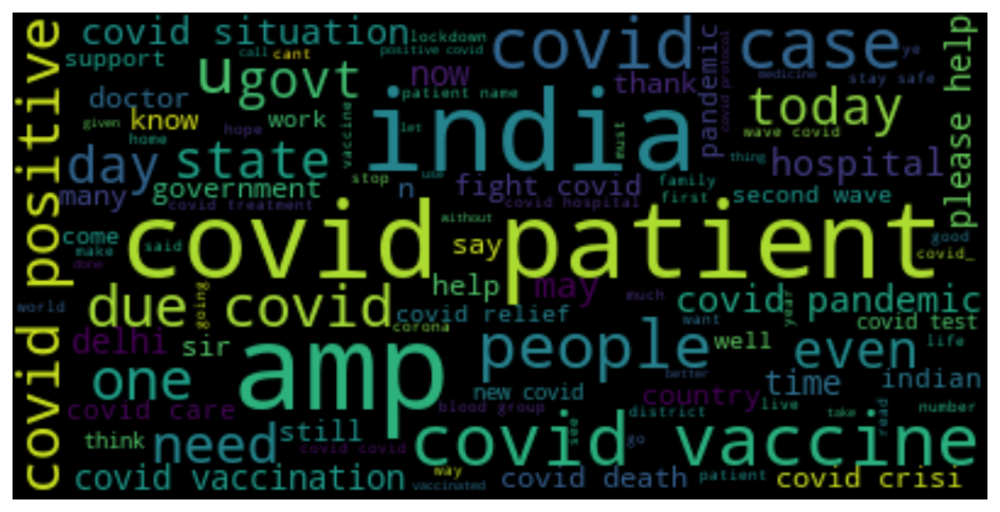

In [22]:
from wordcloud import WordCloud, STOPWORDS , ImageColorGenerator

tweet_All = " ".join(review for review in df_new.text)


fig, ax = plt.subplots(1, 1, figsize  = (16,5))
# Create and generate a word cloud image:
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(tweet_All)

# Display the generated image:
ax.imshow(wordcloud_ALL, interpolation='bilinear')

ax.axis('off')

In [23]:
df_new['text']

0        suryapsingh_ias devprakasmeena nayakragini abh...
1        in_positivity beingsalmankhan babasiddique pls...
2        dharmax swamy ramyabhat nviswam ranganaathan c...
3        rashtrapatibhvn sir makes refrain expressing c...
4        madam fm truly ruthless panadamic times people...
                               ...                        
81555    indias covid disaster sparking worries worst p...
81556    askktr arrangements get covid report day help ...
81557    why implement ayushmaan bharat arogya sri covi...
81558         shivaroor covid dies due massive heat attack
81559    better late never micromanagement covid approp...
Name: text, Length: 81560, dtype: object

In [24]:
temp = df_new.groupby('sentiment').count()['text'].reset_index().sort_values(by='text',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment,text
2,Positive,38415
0,Negative,24903
1,Neutral,18242


<AxesSubplot:xlabel='sentiment', ylabel='count'>

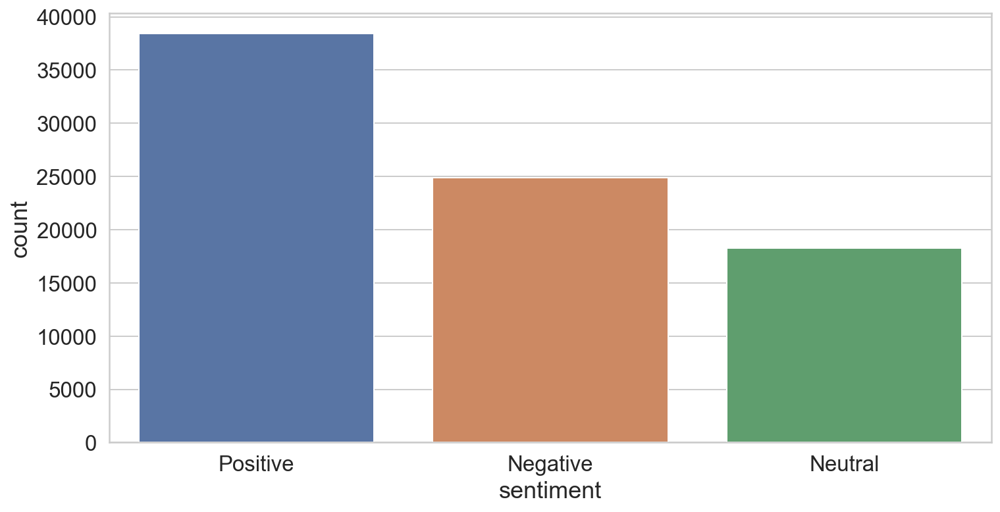

In [25]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df_new)

In [26]:
import plotly.graph_objs as go

fig = go.Figure(go.Funnelarea(
    text =temp.sentiment,
    values = temp.text,
    title = {"position": "top center", "text": "Funnel-Chart of Sentiment Distribution"}
    ))
fig.show()

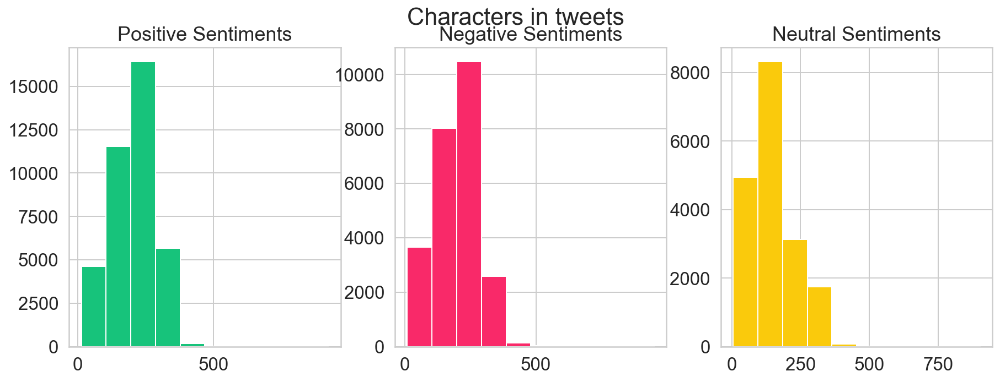

In [27]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.len()
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')

tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.len()
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.len()
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Characters in tweets')
plt.show()

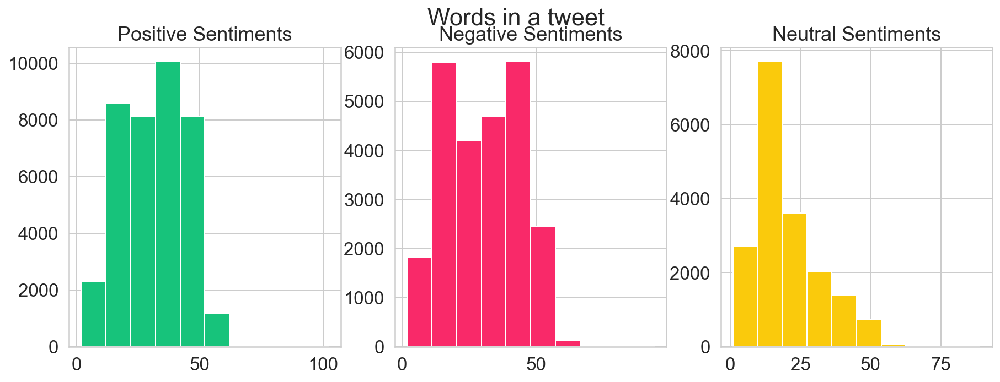

In [28]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().map(lambda x: len(x))
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')


tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().map(lambda x: len(x))
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.split().map(lambda x: len(x))
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Words in a tweet')
plt.show()


Text(0.5, 0.98, 'Average word length in each tweet')

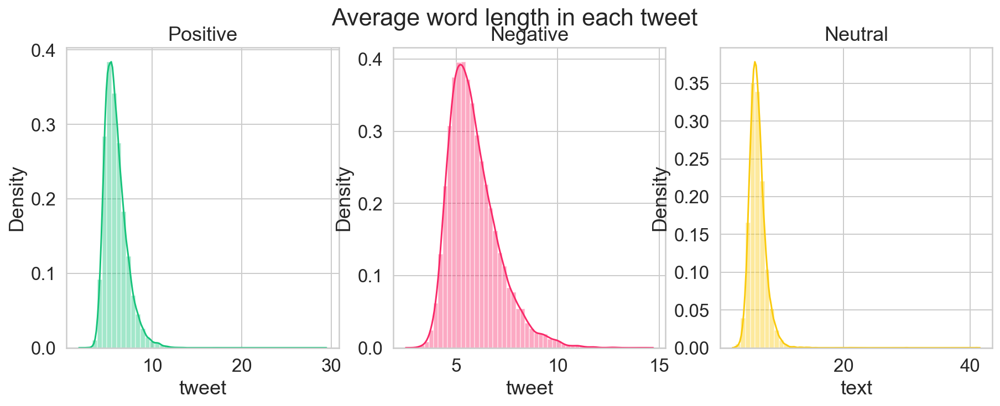

In [29]:
fig,(ax1,ax2, ax3)=plt.subplots(1,3,figsize=(15,5))

word=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax1,color='#17C37B')
ax1.set_title('Positive')


word=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax2,color='#F92969')
ax2.set_title('Negative')

word=df_new[df_new['sentiment']=="Neutral"]['text'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax3,color='#FACA0C')
ax3.set_title('Neutral')


fig.suptitle('Average word length in each tweet')

In [30]:
def create_corpus(target):
    corpus=[]
    
    for x in df_new[df_new['sentiment']==target ]['text'].str.split():
        for i in x:
            corpus.append(i)
    return corpus

In [31]:
np.array(stopwords)

array({'ma', "that'll", 'm', 'of', 'own', 'won', 'if', 'before', 'for', 'all', 'below', "hadn't", 'don', 'with', "you're", "wouldn't", 'to', 'been', 'doesn', 'didn', 'at', 'did', 'wasn', 'from', 'out', 'a', 't', 'this', 'me', 'most', 'these', 'up', 'herself', 'whom', 'because', 'hadn', 'over', 'it', 'does', 'his', 'between', 'where', 'haven', 'under', 'in', 'myself', 'y', "wasn't", 'mustn', 'into', 'them', 'other', 'until', 'any', 'again', 'will', 'and', 'then', 'have', 'only', 'were', 'just', 'above', 'our', 'few', 'yourself', 're', 've', "mightn't", "weren't", "won't", 'hers', 'i', 'himself', "you've", "don't", 'not', 'shan', 'very', 'both', 'too', 'or', 'some', 'mightn', 'she', 'as', 'ain', "should've", 'who', 'nor', 's', 'o', 'how', 'is', "you'd", 'theirs', 'through', 'more', 'here', 'weren', 'further', 'no', 'was', 'being', 'while', 'yours', 'down', "couldn't", 'your', 'are', 'themselves', 'had', 'ours', 'my', 'there', "aren't", 'each', 'off', 'couldn', 'their', 'you', 'he', "must

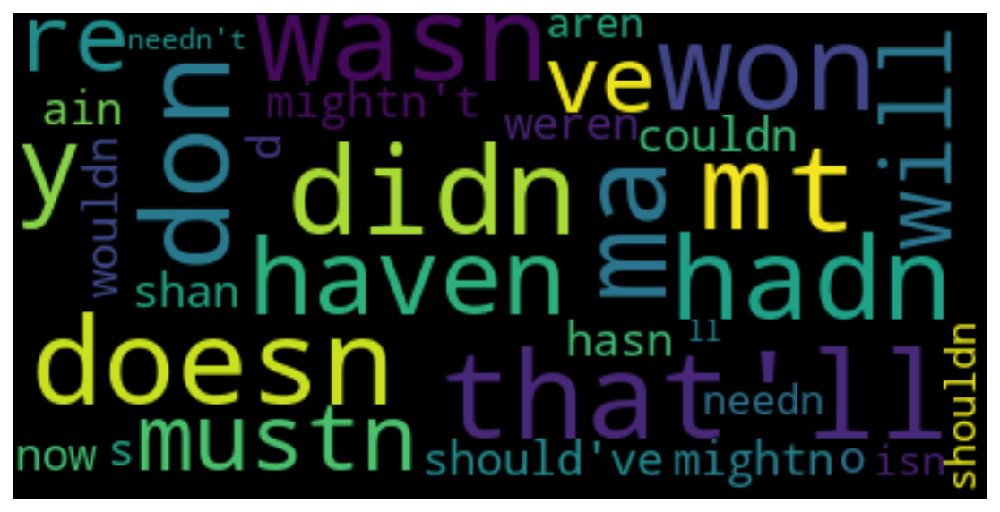

In [32]:
comment_words = '' 
stopwords1 = set(STOPWORDS) 
  
for val in stopwords: 
      
    # typecaste each val to string 
    val = str(val) 
    # split the value 
    tokens = val.split() 
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
  
fig, ax = plt.subplots(1, 1, figsize  = (16,5))
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(comment_words)



# plot the WordCloud image                        
ax.imshow(wordcloud_ALL, interpolation='bilinear')
ax.axis('off')
  
plt.show() 


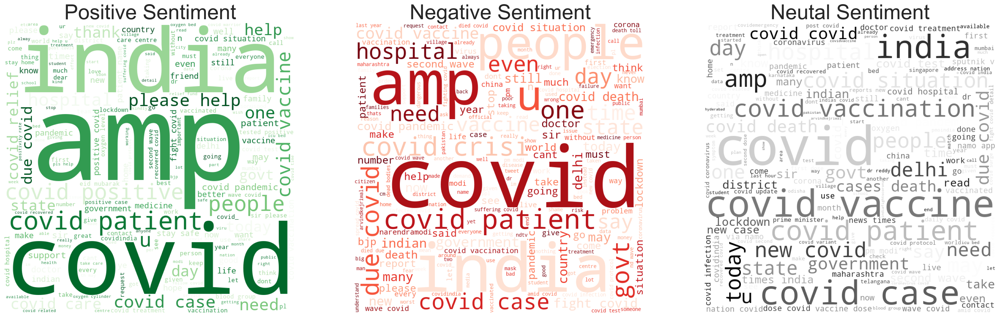

In [33]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=[30, 15])

df_pos = df_new[df_new["sentiment"]=="Positive"]
df_neg = df_new[df_new["sentiment"]=="Negative"]
df_neu = df_new[df_new["sentiment"]=="Neutral"]

comment_words = '' 
stopwords = set(STOPWORDS) 

for val in df_pos.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
   
wordcloud1 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greens",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 

ax1.imshow(wordcloud1)
ax1.axis('off')
ax1.set_title('Positive Sentiment',fontsize=35);

comment_words = ''

for val in df_neg.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud2 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Reds",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words)  
ax2.imshow(wordcloud2)
ax2.axis('off')
ax2.set_title('Negative Sentiment',fontsize=35);

comment_words = ''
for val in df_neu.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud3 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greys",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
ax3.imshow(wordcloud3)
ax3.axis('off')
ax3.set_title('Neutal Sentiment',fontsize=35);

In [34]:
from collections import defaultdict

# Define functions
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(' ') if token != '' if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [' '.join(ngram) for ngram in ngrams]

N = 30


positive= df_new["sentiment"]== "Positive"
negative= df_new["sentiment"]== "Negative"
neutral= df_new["sentiment"]== "Neutral"

positive_unigrams = defaultdict(int)
neutral_unigrams = defaultdict(int)
negative_unigrams = defaultdict(int)

# Unigrams
for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet):
        positive_unigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet):
        negative_unigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet):
        neutral_unigrams[word] += 1        
        
df_positive_unigrams = pd.DataFrame(sorted(positive_unigrams.items(), key=lambda x: x[1])[::-1])
df_negative_unigrams = pd.DataFrame(sorted(negative_unigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_unigrams = pd.DataFrame(sorted(neutral_unigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=150)
plt.tight_layout()

sns.barplot(y=df_positive_unigrams[0].values[:N], x=df_positive_unigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_unigrams[0].values[:N], x=df_negative_unigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_unigrams[0].values[:N], x=df_neutral_unigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common unigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common unigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common unigrams in Neutral Tweets', fontsize=15)

plt.show()

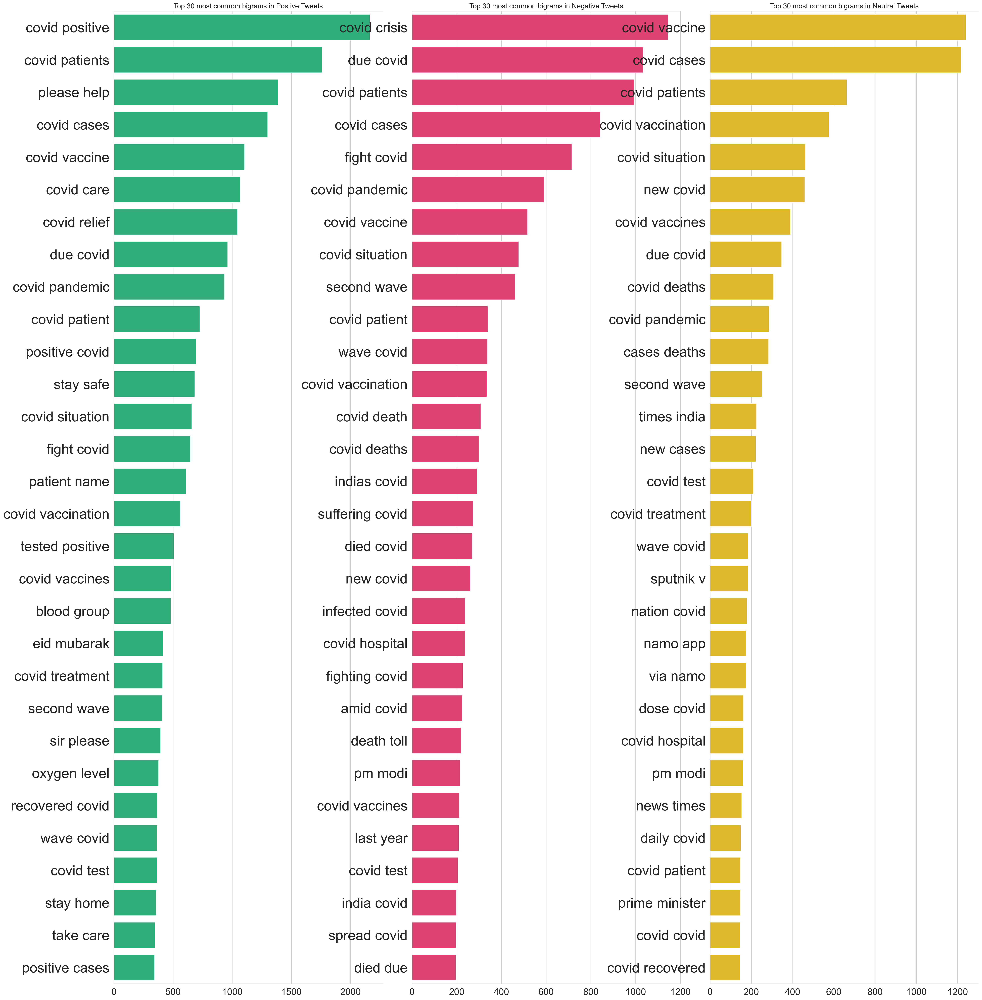

In [35]:
# Bigrams
positive_bigrams = defaultdict(int)
neutral_bigrams = defaultdict(int)
negative_bigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        positive_bigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        negative_bigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        neutral_bigrams[word] += 1        
        
df_positive_bigrams = pd.DataFrame(sorted(positive_bigrams.items(), key=lambda x: x[1])[::-1])
df_negative_bigrams = pd.DataFrame(sorted(negative_bigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_bigrams = pd.DataFrame(sorted(neutral_bigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_bigrams[0].values[:N], x=df_positive_bigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_bigrams[0].values[:N], x=df_negative_bigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_bigrams[0].values[:N], x=df_neutral_bigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common bigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common bigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common bigrams in Neutral Tweets', fontsize=15)

plt.show()

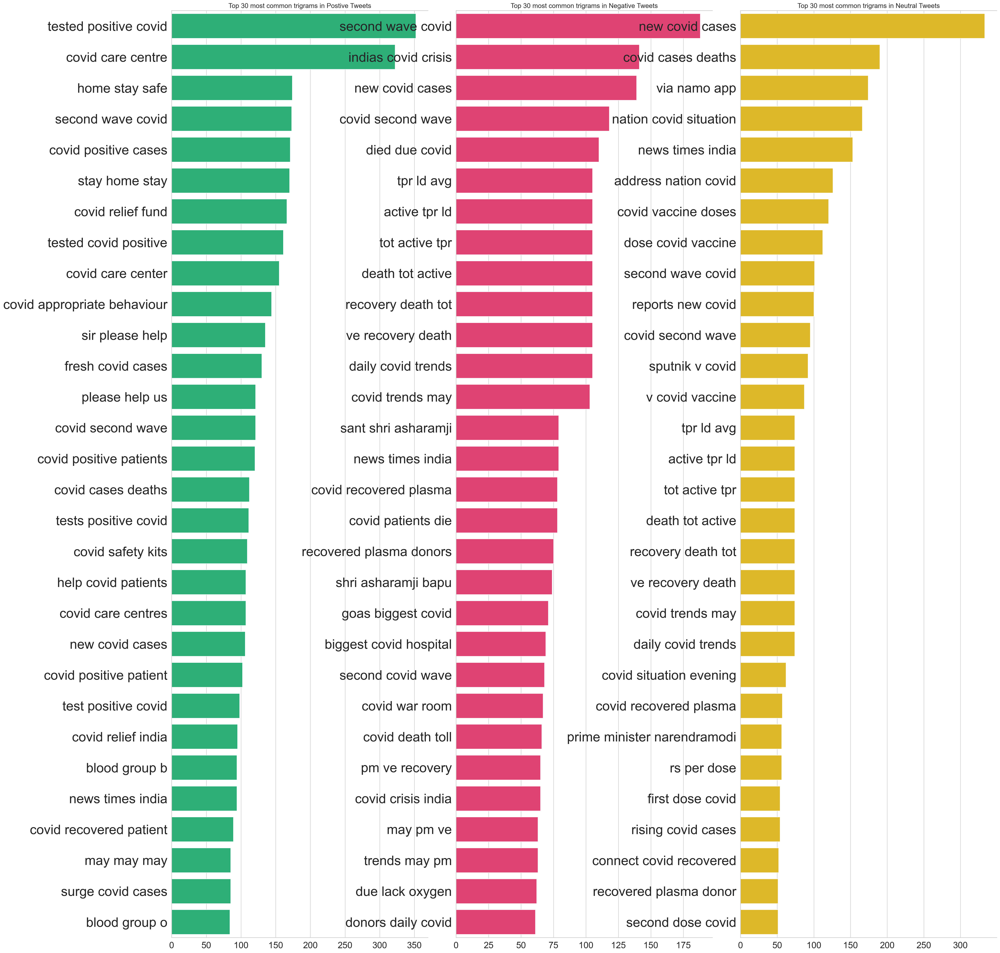

In [36]:
# Trigrams
positive_trigrams = defaultdict(int)
neutral_trigrams = defaultdict(int)
negative_trigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        positive_trigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        negative_trigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        neutral_trigrams[word] += 1        
        
df_positive_trigrams = pd.DataFrame(sorted(positive_trigrams.items(), key=lambda x: x[1])[::-1])
df_negative_trigrams = pd.DataFrame(sorted(negative_trigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_trigrams = pd.DataFrame(sorted(neutral_trigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_trigrams[0].values[:N], x=df_positive_trigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_trigrams[0].values[:N], x=df_negative_trigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_trigrams[0].values[:N], x=df_neutral_trigrams[1].values[:N], ax=axes[2], color='#FACA0C')




for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common trigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common trigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common trigrams in Neutral Tweets', fontsize=15)

plt.show()

In [37]:
df_new.head()

,id,date,time,username,tweet,language,tweets_count,text,sentiment
0,1395219809416093702,2021-05-20,08:58:19,imtanishks,@suryapsingh_IAS @DevprakasMeena @NayakRagini ...,en,1,suryapsingh_ias devprakasmeena nayakragini abh...,Positive
1,1395219809143443462,2021-05-20,08:58:19,ambuj19nov,@in_positivity @BeingSalmanKhan @BabaSiddique ...,en,1,in_positivity beingsalmankhan babasiddique pls...,Positive
2,1395219803330146305,2021-05-20,08:58:17,nhk_varma,@Dharma2X @Swamy39 @RamyaBhat26 @nviswam @rang...,en,2,dharmax swamy ramyabhat nviswam ranganaathan c...,Positive
3,1393061403561533440,2021-05-14,10:01:35,nhk_varma,"@rashtrapatibhvn Sir, what makes you refrain f...",en,2,rashtrapatibhvn sir makes refrain expressing c...,Negative
4,1395219786351603715,2021-05-20,08:58:13,amit_joshi07,"Madam FM is truly ruthless, in these panadamic...",en,2,madam fm truly ruthless panadamic times people...,Positive


In [38]:
df_new = df_new.drop(df_new[df_new.tweets_count >= 10].index)

In [39]:
#As words are in the order of csv files we imported , we have to shuffle the rows & Reindex

df_new = df_new.sample(frac=1).reset_index(drop=True)
df_new.head()

,id,date,time,username,tweet,language,tweets_count,text,sentiment
0,1392815777745555458,2021-05-13,17:45:33,vijuanna1008,@narendramodi @narendramodi_in @myogiadityanat...,en,2,narendramodi narendramodi_in myogiadityanath n...,Positive
1,1393239822064439297,2021-05-14,21:50:33,virajwebchat,We at BBD Group have started Emergency Ambulan...,en,1,we bbd group started emergency ambulance servi...,Positive
2,1392864901668868096,2021-05-13,21:00:45,rohit___rs,EMERGENCY Visakhapatnam Date: 13/5/2021 Patien...,en,1,emergency visakhapatnam date patient name i sr...,Negative
3,1393105348404289537,2021-05-14,12:56:12,false9striker,Close friend’s father who is hospitalized in c...,en,1,close friends father hospitalized critical sta...,Positive
4,1394992790451359744,2021-05-19,17:56:13,b_nagendiran,I would suggest to have covid vaccination camp...,en,1,i would suggest covid vaccination camps school...,Neutral


In [40]:
temp = df_new.groupby('sentiment').count()['text'].reset_index().sort_values(by='text',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment,text
2,Positive,31339
0,Negative,19361
1,Neutral,12531


<AxesSubplot:xlabel='sentiment', ylabel='count'>

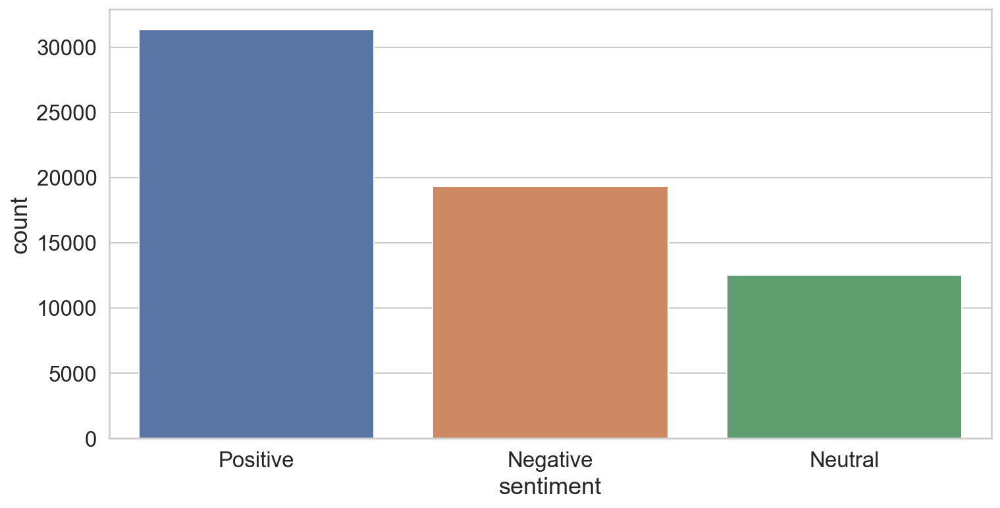

In [41]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df_new)

In [42]:
print(df_new)

                        id        date      time         username  \
0      1392815777745555458  2021-05-13  17:45:33     vijuanna1008   
1      1393239822064439297  2021-05-14  21:50:33     virajwebchat   
2      1392864901668868096  2021-05-13  21:00:45       rohit___rs   
3      1393105348404289537  2021-05-14  12:56:12    false9striker   
4      1394992790451359744  2021-05-19  17:56:13     b_nagendiran   
...                    ...         ...       ...              ...   
63226  1386987228824358912  2021-04-27  15:44:58           ia_csr   
63227  1393126606558928896  2021-05-14  14:20:40  interrissimoali   
63228  1386725621364002821  2021-04-26  22:25:26   chaudharyanilk   
63229  1384751308331130885  2021-04-21  11:40:13   _satyavachan_m   
63230  1384906893316042758  2021-04-21  21:58:28    saundaryagrih   

                                                   tweet language  \
0      @narendramodi @narendramodi_in @myogiadityanat...       en   
1      We at BBD Group have start

In [43]:
df_new_final = pd.concat([df_new.iloc[0:40000]])

In [44]:
len(df_new_final)

40000

In [45]:
export_csv = df_new_final.to_csv(r'covid19 3rd wave.csv')